In [1]:
using CairoMakie
using Statistics

In [2]:
include("io_array.jl")

read_from_csv (generic function with 1 method)

In [3]:
# Average 2D data
function load_average(filename, num_seeds)
    avg = nothing
    for seed in 1:num_seeds
        data = read_from_file(filename * "_seed=$(seed).txt")
        if avg === nothing
            avg = copy(data)
        else
            avg .+= data
        end
    end

    avg ./= num_seeds

    return avg
end

# Compute standard deviation of 2D data
function load_std(filename, num_seeds)
    data_first = read_from_file(filename * "_seed=1.txt")
    (m, n) = size(data_first)

    results_array = zeros(m, n, num_seeds)

    for seed in 1:num_seeds
        data = read_from_file(filename * "_seed=$(seed).txt")
        results_array[:, :, seed] = data
    end

    std_result = std(results_array, dims=3)
    std_result = dropdims(std_result, dims=3)

    return std_result
end

load_std (generic function with 1 method)

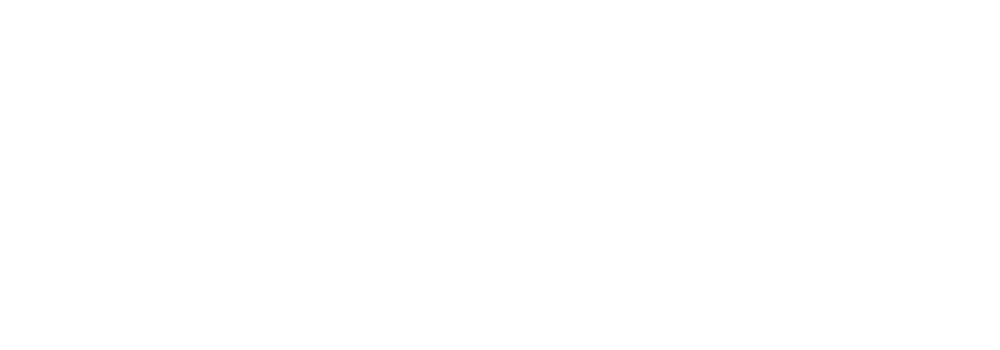

In [4]:
set_theme!(
    fontsize=25,
    Legend=(labelsize=20,),
    Axis=(
        xgridvisible=false,
        ygridvisible=false,
    ),
)

fig = Figure(size=(2000, 700))

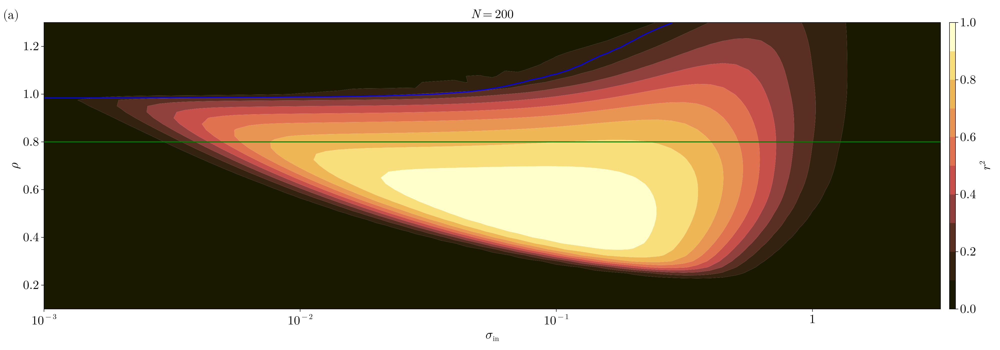

In [5]:
# --- N=200: r2 ---
filename = "data//r2_map//r2_map_N=200"
avg_r2 = load_average(filename, 50)

spectral_radius_grid_r2 = read_from_file("data//r2_map//1_spectral_radius_grid.txt")[:, 1]
input_std_grid_r2 = read_from_file("data//r2_map//2_input_std_grid.txt")[:, 1]

filename = "data//lyapunov_map//lyapunov_map_N=200"
avg_lyap = load_average(filename, 10)

spectral_radius_grid_lyap = read_from_file("data//lyapunov_map//1_spectral_radius_grid.txt")[:, 1]
input_std_grid_lyap = read_from_file("data//lyapunov_map//2_input_std_grid.txt")[:, 1]

ax = Axis(fig[1, 1][1, 1];
    xlabel=L"\sigma_{\mathrm{in}}",
    ylabel=L"\rho",
    xscale=log10,
    xticks=([1e-3, 1e-2, 1e-1, 1], [L"10^{-3}", L"10^{-2}", L"10^{-1}", L"1"]),
    yticks=(0.2:0.2:1.2, [L"0.2", L"0.4", L"0.6", L"0.8", L"1.0", L"1.2"]),
    title=L"N = 200")

xlims!(ax, minimum(input_std_grid_r2), maximum(input_std_grid_r2))
ylims!(ax, minimum(spectral_radius_grid_r2), maximum(spectral_radius_grid_r2))

hm = contourf!(ax, input_std_grid_r2, spectral_radius_grid_r2, avg_r2';
    colormap=:lajolla, levels = 0.0:0.1:1)

contour!(ax, input_std_grid_lyap, spectral_radius_grid_lyap, avg_lyap' .+ 1.0, 
    levels=[0.97], color=:blue, linewidth=2)

hlines!(ax, 0.8; color=:green, linewidth=2)

Colorbar(fig[1, 1][1, 2], hm;
    ticks=(0.0:0.2:1.0, [L"0.0", L"0.2", L"0.4", L"0.6", L"0.8", L"1.0"]),
    label=L"r^2")

Label(fig[1, 1, TopLeft()], L"\mathrm{(a)}";
    fontsize=25,
    halign=:left,
    padding  = (-10, 0, 0, 0))

fig

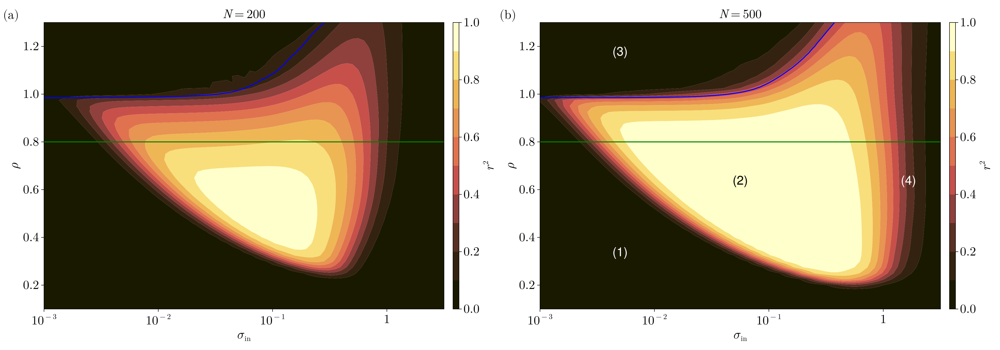

In [6]:
# --- N=500: r2 ---
filename = "data//r2_map//r2_map_N=500"
avg_r2 = load_average(filename, 40)

spectral_radius_grid_r2 = read_from_file("data//r2_map//1_spectral_radius_grid.txt")[:, 1]
input_std_grid_r2 = read_from_file("data//r2_map//2_input_std_grid.txt")[:, 1]

filename = "data//lyapunov_map//lyapunov_map_N=500"
avg_lyap = load_average(filename, 10)

spectral_radius_grid_lyap = read_from_file("data//lyapunov_map//1_spectral_radius_grid.txt")[:, 1]
input_std_grid_lyap = read_from_file("data//lyapunov_map//2_input_std_grid.txt")[:, 1]

ax = Axis(fig[1, 2][1, 1];
    xlabel=L"\sigma_{\mathrm{in}}",
    ylabel=L"\rho",
    xscale=log10,
    xticks=([1e-3, 1e-2, 1e-1, 1], [L"10^{-3}", L"10^{-2}", L"10^{-1}", L"1"]),
    yticks=(0.2:0.2:1.2, [L"0.2", L"0.4", L"0.6", L"0.8", L"1.0", L"1.2"]),
    title=L"N = 500")

xlims!(ax, minimum(input_std_grid_r2), maximum(input_std_grid_r2))
ylims!(ax, minimum(spectral_radius_grid_r2), maximum(spectral_radius_grid_r2))

hm = contourf!(ax, input_std_grid_r2, spectral_radius_grid_r2, avg_r2';
    colormap=:lajolla, levels = 0.0:0.1:1)

contour!(ax, input_std_grid_lyap, spectral_radius_grid_lyap, avg_lyap' .+ 1.0, 
    levels=[0.97], color=:blue, linewidth=2)

hlines!(ax, 0.8; color=:green, linewidth=2)

Colorbar(fig[1, 2][1, 2], hm;
    ticks=(0.0:0.2:1.0, [L"0.0", L"0.2", L"0.4", L"0.6", L"0.8", L"1.0"]),
    label=L"r^2")

text!(ax, 0.2, 0.2,
    text      = "(1)",
    space     = :relative,
    align     = (:center, :center),
    fontsize  = 25,
    color     = :white)

text!(ax, 0.5, 0.45,
    text      = "(2)",
    space     = :relative,
    align     = (:center, :center),
    fontsize  = 25,
    color     = :black)

text!(ax, 0.2, 0.9,
    text      = "(3)",
    space     = :relative,
    align     = (:center, :center),
    fontsize  = 25,
    color     = :white)

text!(ax, 0.92, 0.45,
    text      = "(4)",
    space     = :relative,
    align     = (:center, :center),
    fontsize  = 25,
    color     = :white)

Label(fig[1, 2, TopLeft()], L"\mathrm{(b)}";
    fontsize=25,
    halign=:left,
    padding  = (-10, 0, 0, 0))

fig

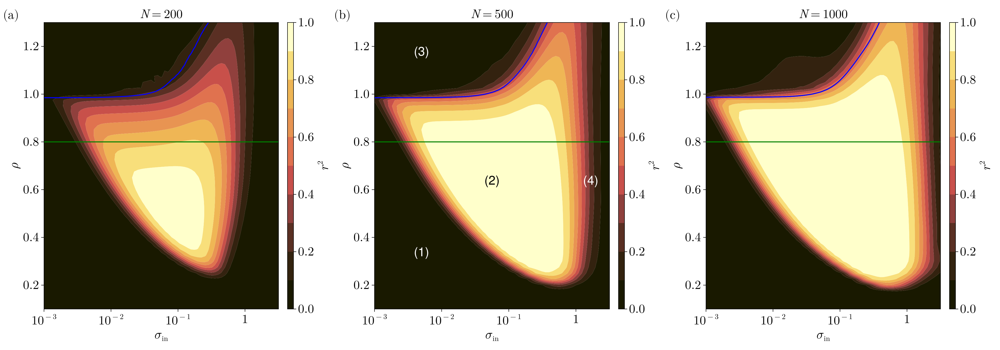

In [7]:
# --- N=1000: r2 ---
filename = "data//r2_map//r2_map_N=1000"
avg_r2 = load_average(filename, 30)

spectral_radius_grid_r2 = read_from_file("data//r2_map//1_spectral_radius_grid.txt")[:, 1]
input_std_grid_r2 = read_from_file("data//r2_map//2_input_std_grid.txt")[:, 1]

filename = "data//lyapunov_map//lyapunov_map_N=1000"
avg_lyap = load_average(filename, 4)

spectral_radius_grid_lyap = read_from_file("data//lyapunov_map//1_spectral_radius_grid.txt")[:, 1]
input_std_grid_lyap = read_from_file("data//lyapunov_map//2_input_std_grid.txt")[:, 1]

ax = Axis(fig[1, 3][1, 1];
    xlabel=L"\sigma_{\mathrm{in}}",
    ylabel=L"\rho",
    xscale=log10,
    xticks=([1e-3, 1e-2, 1e-1, 1], [L"10^{-3}", L"10^{-2}", L"10^{-1}", L"1"]),
    yticks=(0.2:0.2:1.2, [L"0.2", L"0.4", L"0.6", L"0.8", L"1.0", L"1.2"]),
    title=L"N = 1000")

xlims!(ax, minimum(input_std_grid_r2), maximum(input_std_grid_r2))
ylims!(ax, minimum(spectral_radius_grid_r2), maximum(spectral_radius_grid_r2))

hm = contourf!(ax, input_std_grid_r2, spectral_radius_grid_r2, avg_r2';
    colormap=:lajolla, levels = 0.0:0.1:1)

contour!(ax, input_std_grid_lyap, spectral_radius_grid_lyap, avg_lyap' .+ 1.0, 
    levels=[0.97], color=:blue, linewidth=2)

hlines!(ax, 0.8; color=:green, linewidth=2)

Colorbar(fig[1, 3][1, 2], hm;
    ticks=(0.0:0.2:1.0, [L"0.0", L"0.2", L"0.4", L"0.6", L"0.8", L"1.0"]),
    label=L"r^2")

Label(fig[1, 3, TopLeft()], L"\mathrm{(c)}";
    fontsize=25,
    halign=:left,
    padding  = (-10, 0, 0, 0))

fig

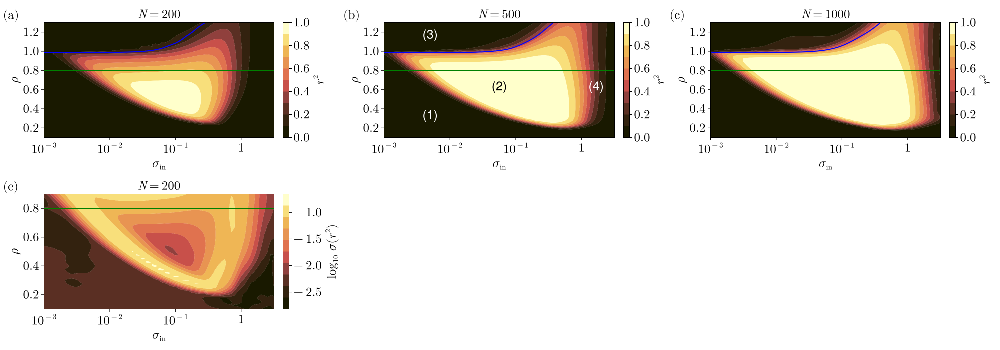

In [8]:
# --- N=200: standard deviation of r2 ---
filename = "data//r2_map//r2_map_N=200"
std_r2 = load_std(filename, 50)

ax = Axis(fig[2, 1][1, 1];
    xlabel=L"\sigma_{\mathrm{in}}",
    ylabel=L"\rho",
    xscale=log10,
    xticks=([1e-3, 1e-2, 1e-1, 1], [L"10^{-3}", L"10^{-2}", L"10^{-1}", L"1"]),
    yticks=(0.2:0.2:1.2, [L"0.2", L"0.4", L"0.6", L"0.8", L"1.0", L"1.2"]),
    title=L"N = 200")

xlims!(ax, minimum(input_std_grid_r2), maximum(input_std_grid_r2))
ylims!(ax, minimum(spectral_radius_grid_r2), 0.9)

hm = contourf!(ax, input_std_grid_r2, spectral_radius_grid_r2, log10.(std_r2)';
    colormap=:lajolla)

hlines!(ax, 0.8; color=:green, linewidth=2)

Colorbar(fig[2, 1][1, 2], hm;
    ticks=(-2.5:0.5:-1.0, [L"-2.5", L"-2.0", L"-1.5", L"-1.0"]),
    label=L"\log_{10} \ \sigma(r^2)")

Label(fig[2, 1, TopLeft()], L"\mathrm{(e)}";
    fontsize=25,
    halign=:left,
    padding  = (-10, 0, 0, 0))

fig

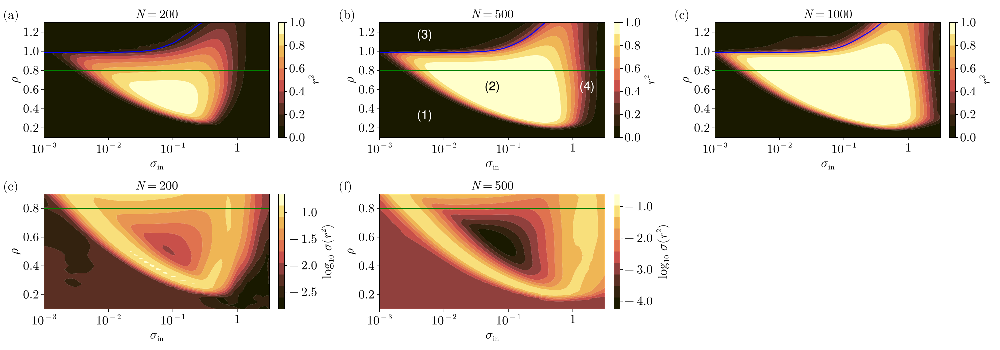

In [9]:
# --- N=500: standard deviation of r2 ---
filename = "data//r2_map//r2_map_N=500"
std_r2 = load_std(filename, 40)

ax = Axis(fig[2, 2][1, 1];
    xlabel=L"\sigma_{\mathrm{in}}",
    ylabel=L"\rho",
    xscale=log10,
    xticks=([1e-3, 1e-2, 1e-1, 1], [L"10^{-3}", L"10^{-2}", L"10^{-1}", L"1"]),
    yticks=(0.2:0.2:1.2, [L"0.2", L"0.4", L"0.6", L"0.8", L"1.0", L"1.2"]),
    title=L"N = 500")

xlims!(ax, minimum(input_std_grid_r2), maximum(input_std_grid_r2))
ylims!(ax, minimum(spectral_radius_grid_r2), 0.9)

hm = contourf!(ax, input_std_grid_r2, spectral_radius_grid_r2, log10.(std_r2)';
    colormap=:lajolla)

hlines!(ax, 0.8; color=:green, linewidth=2)

Colorbar(fig[2, 2][1, 2], hm;
    ticks=(-5.0:1.0:-1.0, [L"-5.0", L"-4.0", L"-3.0", L"-2.0", L"-1.0"]),
    label=L"\log_{10} \ \sigma(r^2)")

Label(fig[2, 2, TopLeft()], L"\mathrm{(f)}";
    fontsize=25,
    halign=:left,
    padding  = (-10, 0, 0, 0))

fig

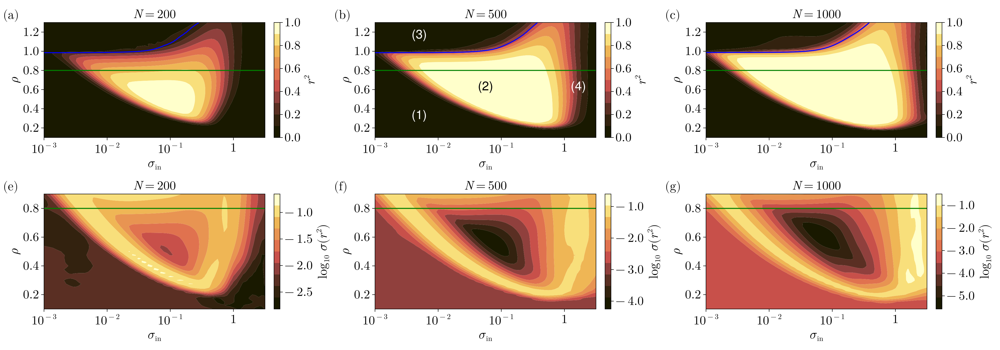

In [10]:
# --- N=1000: standard deviation of r2 ---
filename = "data//r2_map//r2_map_N=1000"
std_r2 = load_std(filename, 30)

ax = Axis(fig[2, 3][1, 1];
    xlabel=L"\sigma_{\mathrm{in}}",
    ylabel=L"\rho",
    xscale=log10,
    xticks=([1e-3, 1e-2, 1e-1, 1], [L"10^{-3}", L"10^{-2}", L"10^{-1}", L"1"]),
    yticks=(0.2:0.2:1.2, [L"0.2", L"0.4", L"0.6", L"0.8", L"1.0", L"1.2"]),
    title=L"N = 1000")

xlims!(ax, minimum(input_std_grid_r2), maximum(input_std_grid_r2))
ylims!(ax, minimum(spectral_radius_grid_r2), 0.9)

hm = contourf!(ax, input_std_grid_r2, spectral_radius_grid_r2, log10.(std_r2)';
    colormap=:lajolla)

hlines!(ax, 0.8; color=:green, linewidth=2)

Colorbar(fig[2, 3][1, 2], hm;
    ticks=(-5.0:1.0:-1.0, [L"-5.0", L"-4.0", L"-3.0", L"-2.0", L"-1.0"]),
    label=L"\log_{10} \ \sigma(r^2)")

Label(fig[2, 3, TopLeft()], L"\mathrm{(g)}";
    fontsize=25,
    halign=:left,
    padding  = (-10, 0, 0, 0))

fig

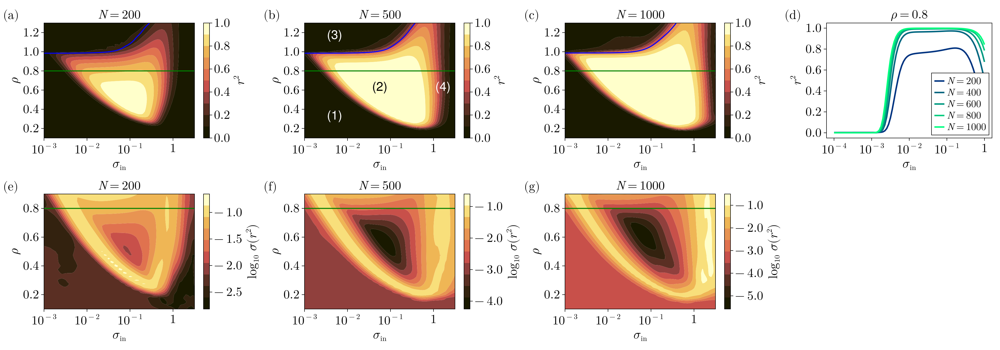

In [11]:
# --- r2 for rho=0.8 ---

input_std_grid = read_from_file("data//r2//1_input_std_grid.txt")[:, 1]

avg_r2_200 = load_average("data//r2//r2_N=200_delay=10", 50)[:, 1]
avg_r2_400 = load_average("data//r2//r2_N=400_delay=10", 50)[:, 1]
avg_r2_600 = load_average("data//r2//r2_N=600_delay=10", 50)[:, 1]
avg_r2_800 = load_average("data//r2//r2_N=800_delay=10", 50)[:, 1]
avg_r2_1000 = load_average("data//r2//r2_N=1000_delay=10", 50)[:, 1]

ax = Axis(fig[1, 4];
    xlabel=L"\sigma_{\mathrm{in}}",
    ylabel=L"r^2",
    xscale=log10,
    xticks=([1e-4, 1e-3, 1e-2, 1e-1, 1], [L"10^{-4}", L"10^{-3}", L"10^{-2}", L"10^{-1}", L"1"]),
    yticks=(0.0:0.2:1.0, [L"0.0", L"0.2", L"0.4", L"0.6", L"0.8", L"1.0"]),
    title=L"\rho = 0.8")

lines!(ax, input_std_grid, avg_r2_200, linewidth=3, color=RGBf(0, 0.2, 0.5), label=L"N = 200")
lines!(ax, input_std_grid, avg_r2_400, linewidth=3, color=RGBf(0, 0.4, 0.5), label=L"N = 400")
lines!(ax, input_std_grid, avg_r2_600, linewidth=3, color=RGBf(0, 0.6, 0.5), label=L"N = 600")
lines!(ax, input_std_grid, avg_r2_800, linewidth=3, color=RGBf(0, 0.8, 0.5), label=L"N = 800")
lines!(ax, input_std_grid, avg_r2_1000, linewidth=3, color=RGBf(0, 1, 0.5), label=L"N = 1000")

axislegend(ax; position=:rb)

Label(fig[1, 4, TopLeft()], L"\mathrm{(d)}";
    fontsize=25,
    halign=:left,
    padding  = (-10, 0, 0, 0))

fig

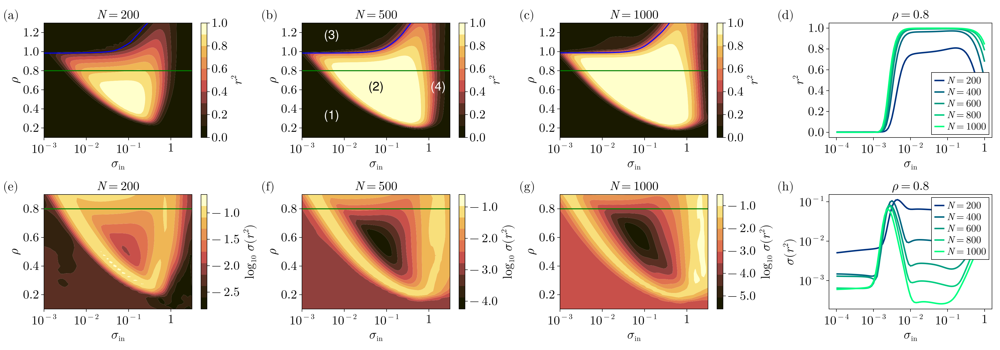

In [12]:
# --- Standard deviation of r2 for rho=0.8 ---

std_r2_200 = load_std("data//r2//r2_N=200_delay=10", 50)[:, 1]
std_r2_400 = load_std("data//r2//r2_N=400_delay=10", 50)[:, 1]
std_r2_600 = load_std("data//r2//r2_N=600_delay=10", 50)[:, 1]
std_r2_800 = load_std("data//r2//r2_N=800_delay=10", 50)[:, 1]
std_r2_1000 = load_std("data//r2//r2_N=1000_delay=10", 50)[:, 1]

ax = Axis(fig[2, 4];
    xlabel=L"\sigma_{\mathrm{in}}",
    ylabel=L"\sigma(r^2)",
    xscale=log10,
    yscale=log10,
    xticks=([1e-4, 1e-3, 1e-2, 1e-1, 1], [L"10^{-4}", L"10^{-3}", L"10^{-2}", L"10^{-1}", L"1"]),
    yticks=([1e-3, 1e-2, 1e-1], [L"10^{-3}", L"10^{-2}", L"10^{-1}"]),
    title=L"\rho = 0.8")

lines!(ax, input_std_grid, std_r2_200, linewidth=3, color=RGBf(0, 0.2, 0.5), label=L"N = 200")
lines!(ax, input_std_grid, std_r2_400, linewidth=3, color=RGBf(0, 0.4, 0.5), label=L"N = 400")
lines!(ax, input_std_grid, std_r2_600, linewidth=3, color=RGBf(0, 0.6, 0.5), label=L"N = 600")
lines!(ax, input_std_grid, std_r2_800, linewidth=3, color=RGBf(0, 0.8, 0.5), label=L"N = 800")
lines!(ax, input_std_grid, std_r2_1000, linewidth=3, color=RGBf(0, 1, 0.5), label=L"N = 1000")

axislegend(ax; position=:rt)

Label(fig[2, 4, TopLeft()], L"\mathrm{(h)}";
    fontsize=25,
    halign=:left,
    padding  = (-10, 0, 0, 0))

fig

In [13]:
save("fig2_r2_map.pdf", fig)

CairoMakie.Screen{PDF}
